# Проектная работа

# Рынок заведений общественного питания Москвы

### Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Ход исследования предполагает:

1.  <a href=#2>Загрузка и знакомство с данными</a>
2.  <a href=#2>Предобработка данных</a>
3.  <a href=#3>Анализ данных</a>
4.  <a href=#4>Детализация исследования: открытие кофейни</a>
5.  <a href=#5>Презентация</a>

## <a name="1"> 1. Загрузка и знакомство с данными.</a>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import json
import plotly.express as px
from plotly import graph_objects as go
import math as mth
from scipy import stats as st
import matplotlib.pyplot as plt
from folium import Map, Marker, Figure, Choropleth
from folium.plugins import MarkerCluster
from folium.features import  GeoJsonTooltip
import plotly.graph_objects as go
from collections import Counter
from plotly.subplots import make_subplots
from datetime import datetime, timedelta
import warnings
warnings.simplefilter('ignore')
pd.options.display.max_colwidth = 150

In [2]:
pd.options.display.float_format = '{:.2f}'.format

In [3]:
try:
    df = pd.read_csv('moscow_places.csv') 
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
# читаем файл и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
except:
     with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)


#### Описание данных

Файл moscow_places.csv:

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

0 — заведение не является сетевым

1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

In [5]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [7]:
pd.DataFrame(round(df.isna().mean().sort_values()*100, 3)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
lat,0.000000
lng,0.000000
rating,0.000000
chain,0.000000
hours,6.376000
seats,42.957000


In [8]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


В датасете представлено 8406 заведений. Названия столбцов указаны корректно.
Типы данных у всех столбцов верные, кроме seats -  нужно перевести в int. Пропуски присутствуют в 6 столбцах:  seats, avg_bill, price, middle_avg_bill, middle_coffee_cup. Так же придется поработать с выбросами в столбце seats.

## <a name="1"> 2. Предобработка данных.</a>

Переведем все строковые данные в нижний регистр для удобства и универсальности

In [9]:
for col in ['name', 'category', 'address', 'hours', 'price', 'avg_bill']:
    df[col] = df[col].str.lower()
df.head()    

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00


Посмотрим есть ли в данных дубликаты

In [10]:
df.duplicated().sum()

0

In [11]:
df.duplicated(subset = ['name', 'address']).sum()

4

Удаляем дубликаты

In [12]:
df = df.drop_duplicates(subset = ['name', 'address'])

In [13]:
df.duplicated(subset = ['name', 'address']).sum()

0

Проверим данные на ошибки в столбцах: category, district, lat, lng,	rating.

,0
0,Северный административный округ
1,Северо-Восточный административный округ
2,Северо-Западный административный округ
3,Западный административный округ
4,Центральный административный округ
5,Восточный административный округ
6,Юго-Восточный административный округ
7,Южный административный округ
8,Юго-Западный административный округ


,0
0,кафе
1,ресторан
2,кофейня
3,пиццерия
4,"бар,паб"
5,быстрое питание
6,булочная
7,столовая


,rating
count,8402.00
mean,4.23
std,0.47
min,1.00
25%,4.10
50%,4.30
75%,4.40
max,5.00


Распределение координат:


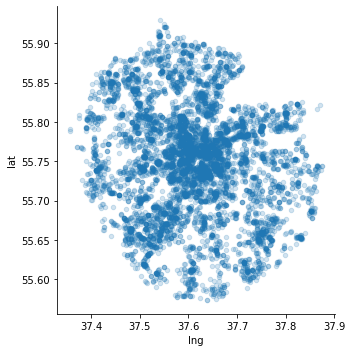

In [14]:
display(
    pd.DataFrame(df['district'].unique()),
    pd.DataFrame(df['category'].unique()),
    pd.DataFrame(df['rating'].describe()),
)
print('Распределение координат:')
sns.lmplot(x="lng", y="lat", data=df, fit_reg=False,
           scatter_kws={'s': 20, 'alpha': 0.2});

В проверяемых стобцах ошибок не обнаружено. Неверных округов нет, категории логично разбиты, рейтинг не имеет аномальных значений, координаты образуют собой карту Москвы.

Проанализируем аномалии с посадочными местами по категориям заведений.

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
count,467.00,148.00,349.00,1217.00,751.00,427.00,1269.00,164.00
mean,124.48,89.39,98.89,97.37,111.20,94.50,121.89,99.75
std,145.16,97.69,106.61,117.92,127.84,112.28,123.79,122.95
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,48.00,25.00,28.00,35.00,40.00,30.00,48.00,40.00
50%,82.00,50.00,65.00,60.00,80.00,55.00,86.00,75.50
75%,148.50,120.00,140.00,120.00,144.00,120.00,150.00,117.00
max,1288.00,625.00,1040.00,1288.00,1288.00,1288.00,1288.00,1200.00


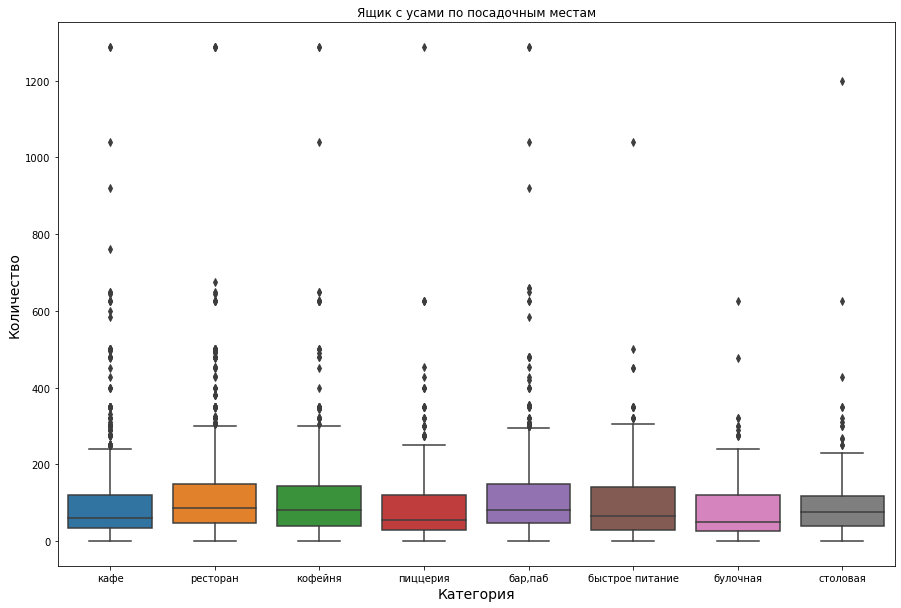

In [15]:
plt.figure(figsize=(15,10))
sns.boxplot(data=df, x='category', y='seats')
plt.title(label='Ящик с усами по посадочным местам')
plt.xlabel("Категория", fontsize=14)
plt.ylabel("Количество", fontsize=14)


df.groupby('category')['seats'].describe().T

На графике видим выбросы. Скорее всего они связаны с ошибкой при заполнении данных, возможно приписан лишний 0. Оставим все, что меньше 600.

In [16]:
print('Заведений с числом мест больше 600:', df[df['seats'] > 600]['name'].count())


Заведений с числом мест больше 600: 53


Таких заведений меньше 1%, удалим их.

In [17]:
df600 = df[df['seats'] > 600]
df = df.query('index not in @df600.index')
print('Заведений с числом мест больше 600:', df[df['seats'] > 600]['name'].count())

Заведений с числом мест больше 600: 0


In [18]:
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 528
lat                     0
lng                     0
rating                  0
price                5053
avg_bill             4555
middle_avg_bill      5216
middle_coffee_cup    7820
chain                   0
seats                3610
dtype: int64

Пропуски есть  в некоторых столбцах и их очень много, но на данный момент заменить их не получится. Возможно в ходе исследования станет понятнее что с ними делать и тогда можно вернуться к этому пункту.

Посмотри уникальные значения в столбце `hours` для последующей унификации.

In [19]:
df['hours'] = df['hours'].astype(str)
sorted(df['hours'].unique())

['nan',
 'вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30',
 'вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00',
 'вт,чт 10:00–18:00',
 'вт,чт,пт,сб,вс 08:00–23:00',
 'вт-вс 09:00–19:00',
 'вт-вс 09:00–21:00',
 'вт-вс 10:00–18:00',
 'вт-вс 10:00–20:00',
 'вт-вс 10:00–21:00',
 'вт-вс 10:00–22:00',
 'вт-вс 10:30–22:00',
 'вт-вс 10:45–21:00',
 'вт-вс 11:00–20:00',
 'вт-вс 11:00–23:00',
 'вт-вс 12:00–00:00',
 'вт-вс 12:00–20:00',
 'вт-вс 12:00–21:00',
 'вт-вс 12:00–23:00',
 'вт-вс 12:00–23:00, перерыв 17:00–18:00',
 'вт-вс 14:00–22:00',
 'вт-вс 17:00–23:00',
 'вт-вс 19:00–06:00',
 'вт-вс круглосуточно',
 'вт-пт 09:00–22:00; сб,вс 10:00–22:00',
 'вт-пт 12:00–20:00; сб,вс 12:00–22:00',
 'вт-сб 09:00–18:00',
 'вт-сб 09:00–21:00',
 'вт-сб 12:00–21:00',
 'вт-сб 17:00–00:00',
 'вт-сб 20:00–06:00',
 'вт-чт 10:00–20:30; пт,сб 10:00–21:30; вс 10:00–20:30',
 'вт-чт 12:00–00:00; пт,сб 12:00–05:00; вс 12:00–00:00',
 'вт-чт 12:00–23:00; пт 12:00–02:00; сб 15:00–02:00'

Добавим новый столбец street с названиями улиц из столбца с адресом.

Добавим новый столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [20]:
def get_street(address):
    address = re.sub(r'\s*,\s*', ',', address)
    address = re.split(',|\.', address)
    return address[1]

In [21]:
def is_24_7(time):
    if time != time:
        return np.nan
    elif time == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [22]:
df['street'] = df['address'].apply(get_street)
df['is_24_7'] = df['hours'].apply(is_24_7)

In [23]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,средний счёт:от 1000 ₽,1000.00,NaN,0,45.00,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8349 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8349 non-null   object 
 1   category           8349 non-null   object 
 2   address            8349 non-null   object 
 3   district           8349 non-null   object 
 4   hours              8349 non-null   object 
 5   lat                8349 non-null   float64
 6   lng                8349 non-null   float64
 7   rating             8349 non-null   float64
 8   price              3296 non-null   object 
 9   avg_bill           3794 non-null   object 
 10  middle_avg_bill    3133 non-null   float64
 11  middle_coffee_cup  529 non-null    float64
 12  chain              8349 non-null   int64  
 13  seats              4739 non-null   float64
 14  street             8349 non-null   object 
 15  is_24_7            8349 non-null   bool   
dtypes: bool(1), float64(6), 

Мы подготовлили данные к дальнейшему исследованию: 
- все строковые данные были переведены в нижний регистр;
- дубликаты удалены;
- отброшены аномалии в посадочных местах;
- ошибок в данных найдено не было;
- были добавлены столбцы с названиями улиц и режимом работы 24/7.

Восстановить пропуски на данный момент нет возможности, как и установить их причины, возможно стоит вернутся к этому вопросу позже.

## <a name="1"> 3. Анализ данных.</a>

#### 3.1 Посмотрим какие категории заведений представлены в данных. Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.

Зададим функцию для построения графиков  методом bar()

In [25]:
def one_plot_creator(df, x, y, color, text=None,
                     title='default tittle', xaxis_title='xaxis tittle', yaxis_title='yaxis tittle',
                     legend_title='legend tittle', barmode='stack',
                     orientation='v', height=500, showlegend=True, for_export=False):

    fig = px.bar(df, x=x, y=y, color=color, text=text, barmode=barmode)

    fig.update_layout(
        height=height,
        showlegend=showlegend,
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        legend_title=legend_title
    )
    
    if for_export == True:
        fig.update_layout({
            'plot_bgcolor': 'rgba(0, 0, 0, 0)',
            'paper_bgcolor': 'rgba(0, 0, 0, 0)',
        })

    return fig

In [26]:
category_name = (df
                  .groupby('category', as_index=False)
                   ['name'].count()
                  .sort_values('name', ascending=False)
                  .reset_index(drop=True)
                 )
category_name.columns = ['category', 'count']
category_name

,category,count
0,кафе,2364
1,ресторан,2030
2,кофейня,1401
3,"бар,паб",755
4,пиццерия,629
5,быстрое питание,602
6,столовая,313
7,булочная,255


In [27]:
go.Figure(data=[go.Pie(labels=category_name['category'], values=category_name['count'])], 
          layout=go.Layout(title=go.layout.Title(text="Диаграмма категорий заведений")))


In [28]:
fig = one_plot_creator(
    df=category_name,
    x='category', y='count', color='category', text='count',
    title='Количество объектов общественного питания по видам',
    xaxis_title='Категории заведений',
    yaxis_title='Количество заведений',
    showlegend=False,
    height=500
)
fig.show()

По количеству заведений лидируют кафе с численностью 2364 - 28%, немного меньше ресторан - 2030 - 24% . На последнем месте булочная - 255 - 3%.

Кафе и рестораны составляют почти 52% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33% от общего числа заведений. На булочные, столовые и быстрое питание приходится 14%.

Больше всего заведений в категориях кафе, ресторан и кофейня. Остальные типы сильно уступают первой тройке.

#### 3.2 Посмотрим количество посадочных мест в заведениях по категориям. Построим визуализации и проанализируем результаты.

In [29]:
df.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",458.00,109.99,95.80,0.00,47.25,80.00,140.00,585.00
булочная,147.00,85.74,87.35,0.00,25.00,50.00,120.00,478.00
быстрое питание,348.00,96.19,94.02,0.00,27.25,65.00,136.25,500.00
кафе,1205.00,90.25,91.07,0.00,35.00,60.00,106.00,600.00
кофейня,739.00,100.43,90.99,0.00,40.00,78.00,140.00,500.00
пиццерия,423.00,87.91,85.48,0.00,30.00,52.00,120.00,455.00
ресторан,1257.00,114.90,96.96,0.00,48.00,86.00,150.00,500.00
столовая,162.00,89.72,77.27,0.00,40.00,75.00,115.00,428.00


Сгруппируем данные по категориям.

In [30]:
df.groupby(by='category', as_index=False).agg(
    min=('seats', 'min'),
    max=('seats', 'max'),
    mean=('seats', 'mean'),
    median=('seats', 'median')
)

,category,min,max,mean,median
0,"бар,паб",0.00,585.00,109.99,80.00
1,булочная,0.00,478.00,85.74,50.00
2,быстрое питание,0.00,500.00,96.19,65.00
3,кафе,0.00,600.00,90.25,60.00
4,кофейня,0.00,500.00,100.43,78.00
5,пиццерия,0.00,455.00,87.91,52.00
6,ресторан,0.00,500.00,114.90,86.00
7,столовая,0.00,428.00,89.72,75.00


Разобьем все кафе по категориям и по количеству посадочных мест, категории выделим на основе информации о всех категориях кафе.

Выделим следующие категории:

- 0 - заведения без посадочных мест
- 0-20 - заведения маленького размера
- 20-80 - заведения среднего размера
- 80-120 - заведения большего размера
- 120+ - очень большие заведения

In [31]:
def categorization_seats(seats):
    if (seats != seats):
        return np.nan
    seats = int(seats)
    if (seats == 0):
        return '0'
    elif (seats <= 20):
        return '1 - 20'
    elif (seats <= 80):
        return '21 - 80'
    elif (seats <= 120):
        return '81 - 120'
    else:
        return '121 +'

In [32]:
df['seats_category'] = df['seats'].apply(categorization_seats)

In [33]:
fig = one_plot_creator(
    df=df.groupby(['category', 'seats_category'], as_index=False).agg(count=('category', 'count')).sort_values('count', ascending=False),
    x='category', y='count', color='seats_category',
    title='Распределение количества посадочных мест по категориям заведений',
    xaxis_title='Категория заведения',
    yaxis_title='Количество',
    legend_title='Категория посадочных мест',
    barmode='group',
    height=450
)
fig.show()

На графике хорошо видно, что во всех категориях заведений доминирует категория заведений среднего размера от 21 до 80 посадочных мест,
следом в во всех категориях идет заведения очень большего размера от 121 посадочного места,
потом заведения большего размера от 81 до 120 посадочных мест
и далее заведения маленького размера от 1 до 20 посадочных мест, меньше всего заведений без посадочных мест.

#### 3.3 Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [34]:
chains = df['chain'].value_counts().reset_index()
chains.columns = ['chain', 'count']
chains

,chain,count
0,0,5172
1,1,3177


In [35]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chains['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

Посмотрим распределение по категориям заведений.

In [36]:
chains = df.groupby(by=['category', 'chain'], as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False)
chains.loc[chains['chain'] == 0, 'chain'] = 'несетевое'
chains.loc[chains['chain'] == 1, 'chain'] = 'сетевое'
for i in range(len(chains)):
    chains.at[i, 'ratio'] = str(round(
        chains.loc[i]['count']/len(df[df['category'] == chains.loc[i]['category']]), 1) * 100) + '%'

In [37]:
fig = one_plot_creator(
    df=chains,
    x='category', y='count', color='chain', text='ratio',
    title='Соотношение сетевых кафе по категориям',
    xaxis_title='категория', yaxis_title='количество',
    legend_title='сеть',height=450
)
fig.show()

Только 38% всех заведений являются сетевыми.

Самые большие проценты сетевых заведений наблюдаются в следующих категориях:

- 60% булочная

- 50% кофейня и пиццерия

- 40% ресторан и быстрое питание

#### 3.4 Найдем топ-15 популярных сетей в Москве. Найдем признак, который их объединяет и категорию заведений. Построим подходящую визуализацию.

Посмотрим какие сети и сколько всего входят в топ-15 по Москве, проанализируем их рейтинг и распределение по районам.

In [38]:
top_15 = (df[df['chain'] == 1]
         .groupby('name').agg({'rating' : 'mean', 'category' : pd.Series.mode, 'district' : 'count'})
         .rename(columns={'district':'count'})
         .sort_values('count', ascending = False).reset_index().head(15)
         )
top_15

,name,rating,category,count
0,шоколадница,4.18,кофейня,118
1,домино'с пицца,4.17,пиццерия,76
2,додо пицца,4.29,пиццерия,74
3,one price coffee,4.06,кофейня,70
4,яндекс лавка,3.87,ресторан,68
5,cofix,4.08,кофейня,65
6,prime,4.12,ресторан,50
7,хинкальная,4.32,кафе,44
8,кофепорт,4.15,кофейня,42
9,теремок,4.12,ресторан,38


In [39]:
print('Всего заведений в Топ-15:', top_15['count'].sum())

Всего заведений в Топ-15: 811


In [40]:
fig = one_plot_creator(
    df=top_15.query('count>15'),
    x='name', y='count', color='category', text='count',
    title='Самые популярные категории топ-15 сетей в Москве',
    xaxis_title='Название сети', yaxis_title='Количество',
    legend_title='Категория', height=500
)
fig.show()

In [41]:
fig = one_plot_creator(
    df=top_15,
    x='name', y='rating', color='category',
    title='Средний рейтинг топ-15 сетевых заведений ',
    xaxis_title='Название сети', yaxis_title='Рейтинг',
    showlegend=True, legend_title='Категория',
)
fig.update_layout(
    yaxis_range=[3.8, 4.5],
    height=450
)
fig.show()

In [42]:
district_chain = (df[df['chain'] == 1]
         .groupby(['district', 'category', 'name']).agg({'rating' : 'mean', 'address' : 'count'})
         .rename(columns={'address':'count'})
         .sort_values('count', ascending = False).reset_index()
         )
district_chain = district_chain[district_chain['name'].isin(top_15['name'])]
district_chain.head(15)

,district,category,name,rating,count
0,Центральный административный округ,кофейня,шоколадница,4.18,38
1,Центральный административный округ,ресторан,prime,4.16,36
2,Центральный административный округ,кафе,кулинарная лавка братьев караваевых,4.40,32
3,Центральный административный округ,кофейня,cofix,4.15,20
4,Западный административный округ,кофейня,шоколадница,4.16,16
5,Центральный административный округ,кофейня,кофепорт,4.28,15
6,Центральный административный округ,кофейня,one price coffee,4.25,15
8,Северный административный округ,кофейня,шоколадница,4.15,13
9,Южный административный округ,ресторан,яндекс лавка,3.95,12
10,Восточный административный округ,ресторан,яндекс лавка,3.83,12


In [43]:
fig = one_plot_creator(
    df=district_chain,
    x='district', y='count', color='category',
    title='Распределение сетевых заведений по районам',
    xaxis_title='Округ', yaxis_title='Количество',
    showlegend=True, legend_title='Категория', height=700
)

fig.show()

Составив топ-15 самых популярных заведений, получили:
- Всего заведений в Топ-15 - 811
- Больше всего заведений в категории кофейня. У ресторанов, пиццерий и кафе примерно одинаковое количество. У булочных в топ-15 меньше всего заведений.
- Больше всего заведений из топ-15 находятся в Центральный административный округе. Преимущественно категории кофейни, рестораны и кафе. В остальных округах примерно одинаковое распределение, за исключением Северо-Западном, там меньше всего.
- Средний рейтинг у всех заведений находиться в промежутке от 3.9 до 4.5
- Данных по ценам очень мало, поэтому по ним сказать нечего

#### 3.5 Посмотрим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. Построим визуализауию.

In [44]:
district_count = (
    df.groupby(['district', 'category'], as_index=False)
    .agg(count=('name', 'count')).sort_values('count', ascending=False)
)

In [45]:
fig = one_plot_creator(
    df=district_count,
    x='district', y='count', color='category', 
    title='Распределение категорий заведений по районам',
    xaxis_title='Округ', yaxis_title='Количество',
    legend_title='Категория заведения', barmode='group',height=600
)
fig.show()

Больше всего заведений в Центральном административном округе, так же в нем в отличие от других районов, доминируют рестораны. В остальных районах количество заведений не сильно различается - от 700 до 900, выделить можно только Северо-Западный округ, в котором меньше всего заведений - 409.

#### 3.6 Посмотрим распределение средних рейтингов по категориям заведений и различие усреднённых рейтингов в разных типах общепита. Построим визуализацию.

In [46]:
rating_category = df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [47]:
fig = one_plot_creator(
    df=rating_category,
    x='rating', y='category', color='category', text='rating',
    title='Распределение средних рейтингов по категориям заведений',
    xaxis_title='Рейтинг', yaxis_title='Категория',
    showlegend=False
)
fig.update_layout(
    xaxis_range=[3.8, 4.5],
    height=500
)
fig.show()

In [48]:
rating_dist_cat = (
    df.groupby(['category', 'district'], as_index=False)
    .agg(count=('rating', 'mean')).sort_values('count', ascending=False)
)

In [49]:
fig = one_plot_creator(
    df=rating_dist_cat,
    x='district', y='count', color='category', 
    title='Распределение средних рейтингов по округам',
    xaxis_title='Округ', yaxis_title='Рейтинг',
    legend_title='Категория заведения', barmode='group'
)
fig.update_layout(
    yaxis_range=[3.9, 4.5],
    height=600
)
fig.show()

По графикам можно сказать следующее:

- Cамый высокий рейтинг по всем районам у баров
- Cледом идут и примерно в одном оценочном диапазоне - пиццерия, рестораны и кофейня
- Самый низкий рейтинг почти по всем районам у быстрого питания и кафе
- Самые высокие оценки по Центральному округу, район с самыми низкими оценками - Юго-Восточный


#### 3.7 Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле ``admin_level_geomap.geojson``

In [50]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [51]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m).geojson.add_child(GeoJsonTooltip(['name'], labels=False))

# выводим карту
m


Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [52]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Основная масса заведений сконцентрирована в центре Москвы. Меньше на севере и еще меньше на юге.

#### 3.9 Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [53]:
streets = df.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).head(15).index.tolist()
street_cat = df[df['street'].isin(streets)].groupby(['street'], as_index=False).agg(
    count=('name', 'count')).sort_values('count', ascending=False)

In [54]:
fig = one_plot_creator(
    df=street_cat,
    x='count', y='street', color='count', text='count',
    title='Количество категорий заведений в разбивке по улицам',
    xaxis_title='Количество', yaxis_title='Улица',
    legend_title='Категория заведения',
    orientation='h'
)
fig.show()

По графику видно:

- Больше всего заведений на пр. Мира, ул. Профсоюзной. пр. Вернадского и Ленинский пр. Обусловлено это тем, что эти улицы очень длинные. Также следует учесть, что эти улицы берут начало из центральных районов Москвы, что обеспечивает высокую проходимость и наличие различных торговых и развлекательных объектов. Это создает благоприятную среду для развития и процветания различных категорий заведений, привлекая предпринимателей и широкую аудиторию клиентов.
- Самые популярные категории заведений кафе и ресторан, далее идут кофейни, быстрое питание и пиццерии.

#### 3.9 Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [55]:
single_cafe = df.groupby('street').agg(count=('name', 'count')).sort_values(
    'count', ascending=False).query('count == 1').index.tolist()
single_cafe_street = df[df['street'].isin(single_cafe)].groupby(
    'category', as_index=False).agg(count=('name', 'count')).sort_values('count', ascending=False)


In [56]:
fig = one_plot_creator(
    df=single_cafe_street,
    x='count', y='category', color='category', text='count',
    title='Количество категорий одиночных кафе в разбивке по улицам',
    xaxis_title='Количество', yaxis_title='Категория заведения',
    showlegend=False,
    orientation='h',
    height=450
)
fig.show()

По графику видно:
- На не популярных улицах больше всего кафе далее идут рестораны и кофейни, всех остальных категорий очень мало.
- Можно предположить что связано это с тем, что такие заведения как столовая, бар, пиццерия и быстрое питание, открывают там где большой поток клиентов. А кафе, ресторан и кофейни, могут открывать в местах, где нет конкурентов и без огромной проходимости.

#### 3.10 Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Посмотрим как удалённость от центра влияет на цены в заведениях.

In [57]:
dist_avg_bill = df.groupby('district', as_index=False).agg(
    avg_bill=('middle_avg_bill', 'mean'))
dist_avg_bill['avg_bill'] = round(dist_avg_bill['avg_bill'], 2)

In [58]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_avg_bill,
    columns=['district', 'avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m).geojson.add_child(GeoJsonTooltip(['name'], labels=False))

# выводим карту
m

- Cамый дорогой средний чек в Центральном и Западном округах, это самые дорогие районы Москвы.
- Самый дешевый средний чек в Северо-Восточном и Юго-Восточном округах, остальные районы не сильно отличаются друг от друга.
- В целом, отдаление от центра дальше, чем Центральный округ, не сильно влияет на средний чек, дальше работает правильно: "дорогой район" - дороже, "дешевый" - дешевле.

#### 3.11 Исследуем часы работы заведений и их зависимость от расположения и категории заведения. 

In [59]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df.query('is_24_7==True').groupby('district', as_index=False).agg(is_24_7=('is_24_7', 'count')),
    columns=['district', 'is_24_7'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Количество круглосуточных заведений',
).add_to(m).geojson.add_child(GeoJsonTooltip(['name'], labels=False))
# выводим карту
m



In [60]:
fig = one_plot_creator(
    df=df.query('is_24_7==True').groupby('category', as_index=False).agg(is_24_7=('is_24_7', 'count')).sort_values('is_24_7', ascending=False),
    x='is_24_7', y='category', color='category', text='is_24_7',
    title='Количество круглосуточных заведений',
    xaxis_title='Количество заведений', yaxis_title='Категория заведения',
    showlegend=False,
    orientation='h',
    height=450
)

fig.show()

- Чаще всего круглосутоными заведениями являются кафе, быстрое питание и рестораны, остальных категорий заведений сильно меньше, ожидаемо количество круглосуточных столовая и булочная меньше всех.

- Так же ожидаемо больше всего круглосуточных заведений в Центральном округе, в остальных округах показатель примерно одинаковый, кроме Северо-Западного, он очень сильно отстает от остальных.

### Вывод

Все очень сильно меняется от района к району, но в целом подытожить можно так:

- Больше всего заведений в категориях кафе с численностью 2378, немного меньше ресторан -2043 и последнем месте булочная - 255. Кафе и рестораны составляют почти 52,6% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 33,43% от общего числа заведений. На булочные, столовые и быстрое питание приходится 13,97%.

- Чаще всего заведения среднего размера, от 21 до 80 посадочных мест, больше всего посадочных мест предоставляют рестораны, что понятно, так как такова специфика этих заведений, люди приходят туда отдохнуть и поесть. Для кафе и столовых посадочных мест меньше всего.
- Только 38% всех заведений являются сетевыми, у булочных 60%, кофейня и пиццерия 50%. Из полученных данных мы видим, что самая популярная сеть в Москве - Шоколадница. На втором и третьем месте известные пиццерии. Меньше всего заведений в сети Му-Му. Самые популярные категории сетевых заведений: кофейня, кафе, ресторан, пиццерия и булочная.

- Больше всего заведений в ЦАО, так же в нем в отличие от других районов, доминируют рестораны. В остальных районах количество заведений не сильно различается, выделить можно только СЗАО, там меньше всего заведений.
- Самый высокий рейтинг по всем районам у баров, самый низкий рейтинг почти по всем районам у быстрого питания и кафе.
- Самый "залайканый" район ЦАО , район с самыми низкими оценками ЮВАО.
- Больше всего заведений на пр. Мира, ул. Профсоюзной. пр. Вернадского и Ленинский пр.,обусловлено это тем что эти улицы очень длинные.
- На непопулярных улицах больше всего кафе, рестораны и кофейни.
- Самый дорогой средний чек в ЦАО и ЗАО, это самые дорогие районы Москвы, а самый дешевый средний чек в СВАО и ЮВАО.
- Чаще всего круглосутоными заведениями являются кафе, быстрое питание и рестораны, количество круглосуточных столова и булочная меньше всех.

## <a name="4"> 4. Детализация исследования: открытие кофейни.</a>

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Ответим на следующие вопросы:

1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

2. Есть ли круглосуточные кофейни?

3. Какие у кофеен рейтинги? Как они распределяются по районам?

4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [61]:
cofe_df = df[df['category'] == 'кофейня']
print('Всего коффен:', cofe_df.shape[0])

Всего коффен: 1401


In [62]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_df.apply(create_clusters, axis=1)

# выводим карту
m

У нас 1401 кофеен. Больше всего в Центральном округе. Большой поток туристов, посетителей и работников способствует развитию кофейных заведений в центральном районе. Следом на юго-западе и на северной части города.

2. Есть ли круглосуточные кофейни?

In [63]:
cofe_24_7 = cofe_df[cofe_df['is_24_7'] == True]
print('Круглосуточных коффен:', cofe_24_7.shape[0])

Круглосуточных коффен: 59


59 кофеен, которые работают круглосуточно. Это составляет 4% от общего числа. Посмотрим расположение.

In [64]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        legend_name='Круглосуточный режим кофеен'
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_24_7.apply(create_clusters, axis=1)

# выводим карту
m

Здесь хорошо видно, что большая часть круглосуточных кофеен находится в центре города. В остальных округах это почти не распространено.

3. Посмотрим какие у кофеен рейтинги. Как они распределяются по районам.

In [65]:
rating_cofe = cofe_df.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_cofe

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [66]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг в округах: Центральный административный округ и Северо-Западный административный округ. Самый низкий рейтинг у Западного административного округа.

4. Посмотрим на какую стоимость чашки капучино стоит ориентироваться при открытии.

In [67]:
middle_cofe = cofe_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(middle_cofe)
print('Средняя стоимость чашки кофе в Москве:', round(middle_cofe['middle_coffee_cup'].mean(),2))

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.23


In [68]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_cofe,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по районам',
).add_to(m)

# выводим карту
m

Самый дорогой кофе в Центральном, Западном и Юго-Западном округах. Средняя стоимость стоимость чашки кофе по всей Москве составляет 171,23.
При открытии нового заведения, для формирования цены стоимости чашки кофе, стоит ориентироваться на район, в котором вы открываете заведение. Цена должна быть не выше средней по району.

#### Рекомендация инвесторам:
При открытии новой кофейни, основываясь на проведенном анализе данных, можно сделать следующие выводы:

1. Лучше выбрать Центральный, Западный или Юго-Западный округа, так как в этих районах средняя стоимость чашки кофе выше, что позволит иметь хорошую маржинальность. При запуске нового заведения это также позволит начать с более высокой цены на чашку кофе и потенциально увеличить доходы без серьезных потерь.

2. Стоит рассмотреть круглосуточный режим работы. Западный и Юго-Западный округа имеют явный недостаток круглосуточных кофеен, что создает потенциальную возможность привлечения большего числа клиентов в этих районах. В Центральном округе также лучше рассмотреть формат 24/7, так как это самый оживленный район с большим количеством пешеходных улиц, и спрос на кофе может сохраняться в течение всей ночи.

3. У заведений в Западном и Юго-Западном направлении отмечается низкий рейтинг. Это можно использовать как преимущество при старте новой кофейни, предлагая высокое качество продукта и лучший сервис, чтобы привлечь клиентов и выделиться на фоне существующих заведений.

Учитывая эти факторы, выбор Центрального, Западного или Юго-Западного округов для открытия новой кофейни, работающей круглосуточно, может предоставить выгодные возможности для успешного старта и развития бизнеса.

## <a name="5"> 5. Презентация.</a>

Презентация: <https://files.sberdisk.ru/s/TL5FFoIIb7cddUY>